
## CoinVision AI Intelligent Coin Classification
Using Deep Learning, Develop an application that automatically identifies the country and denomination of a coin from an image using deep learning.

## Import Libraries
Imports the core libraries needed to inspect files, read the class dictionary, and organize results in a table.

In [1]:
import cv2
import os
import json
import pandas as pd

## Load Dataset

Sets the folder locations for the dataset, train/test splits, and the class dictionary file.

In [ ]:
DATA_DIR = ("data")
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")
CAT_TO_NAME_PATH = os.path.join(DATA_DIR, "cat_to_name.json")

In [3]:
with open(CAT_TO_NAME_PATH, "r") as f:
    cat_to_name = json.load(f)

print("Total classes:", len(cat_to_name))
print("Example:", cat_to_name["1"])

Total classes: 257
Example: 1 Cent,Australian dollar,australia


## Parse Classes into a Table

Splits each label into separate columns (denomination, currency, country) for easier analysis.

In [4]:
rows = []
rows = []
for class_id, label in cat_to_name.items():
    parts = label.split(",")
    denomination, currency, country = parts[0], parts[1], parts[2]
    rows.append({
        "class_id": class_id,
        "denomination": denomination,
        "currency": currency,
        "country": country
    })

classes_df = pd.DataFrame(rows)
classes_df.head()

,class_id,denomination,currency,country
0,1,1 Cent,Australian dollar,australia
1,2,2 Cents,Australian dollar,australia
2,3,5 Cents,Australian dollar,australia
3,4,10 Cents,Australian dollar,australia
4,5,20 Cents,Australian dollar,australia


## Count Images per Class

Counts how many images exist per class in both the train and test folders.

In [5]:
def count_images_per_class(base_dir):
    counts = {}
    for class_id in os.listdir(base_dir):
        class_path = os.path.join(base_dir, class_id)
        if os.path.isdir(class_path):
            counts[class_id] = len(os.listdir(class_path))
    return counts

train_counts = count_images_per_class(TRAIN_DIR)
test_counts = count_images_per_class(TEST_DIR)

classes_df["train_images"] = classes_df["class_id"].map(train_counts)
classes_df["test_images"] = classes_df["class_id"].map(test_counts)
classes_df.head()

,class_id,denomination,currency,country,train_images,test_images
0,1,1 Cent,Australian dollar,australia,28,4
1,2,2 Cents,Australian dollar,australia,28,4
2,3,5 Cents,Australian dollar,australia,26,4
3,4,10 Cents,Australian dollar,australia,26,4
4,5,20 Cents,Australian dollar,australia,22,4


## Dataset Summary

Prints overall totals: number of classes, images, countries, and the spread of images per class.

In [6]:
print("Total classes:", classes_df.shape[0])
print("Total train images:", classes_df["train_images"].sum())
print("Total test images:", classes_df["test_images"].sum())
print("Total countries:", classes_df["country"].nunique())
print("\nImages per class - train (min/max/mean):")
print(classes_df["train_images"].describe()[["min", "max", "mean"]])

Total classes: 257
Total train images: 6453
Total test images: 868
Total countries: 41

Images per class - train (min/max/mean):
min      1.000000
max     52.000000
mean    25.108949
Name: train_images, dtype: float64


In [7]:
OUTPUT_PATH = os.path.join(DATA_DIR, "class_dictionary.csv")
classes_df.to_csv(OUTPUT_PATH, index=False)
print("Saved:", OUTPUT_PATH)

Saved: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\data\class_dictionary.csv


In [8]:
import os

DATA_DIR = r"C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\data"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")

## Exploratory Data Analysis (EDA)

Imports libraries for data handling, visualization, image reading, and hashing.

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hashlib
import random
from PIL import Image

# Visual settings
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["figure.dpi"] = 120
plt.rcParams["font.family"] = "DejaVu Sans"

In [10]:
classes_df = pd.read_csv(os.path.join(DATA_DIR, "class_dictionary.csv"))
classes_df.head()

,class_id,denomination,currency,country,train_images,test_images
0,1,1 Cent,Australian dollar,australia,28,4
1,2,2 Cents,Australian dollar,australia,28,4
2,3,5 Cents,Australian dollar,australia,26,4
3,4,10 Cents,Australian dollar,australia,26,4
4,5,20 Cents,Australian dollar,australia,22,4


## Dataset Overview

Prints total images, classes, countries, and currencies.

In [11]:
total_images = classes_df["train_images"].sum() + classes_df["test_images"].sum()
print("Total images (train + test):", total_images)
print("Total classes:", classes_df.shape[0])
print("Total countries:", classes_df["country"].nunique())
print("Total currencies:", classes_df["currency"].nunique())

Total images (train + test): 7321
Total classes: 257
Total countries: 41
Total currencies: 41


## Distribution by Country

Shows how train images are distributed across countries.

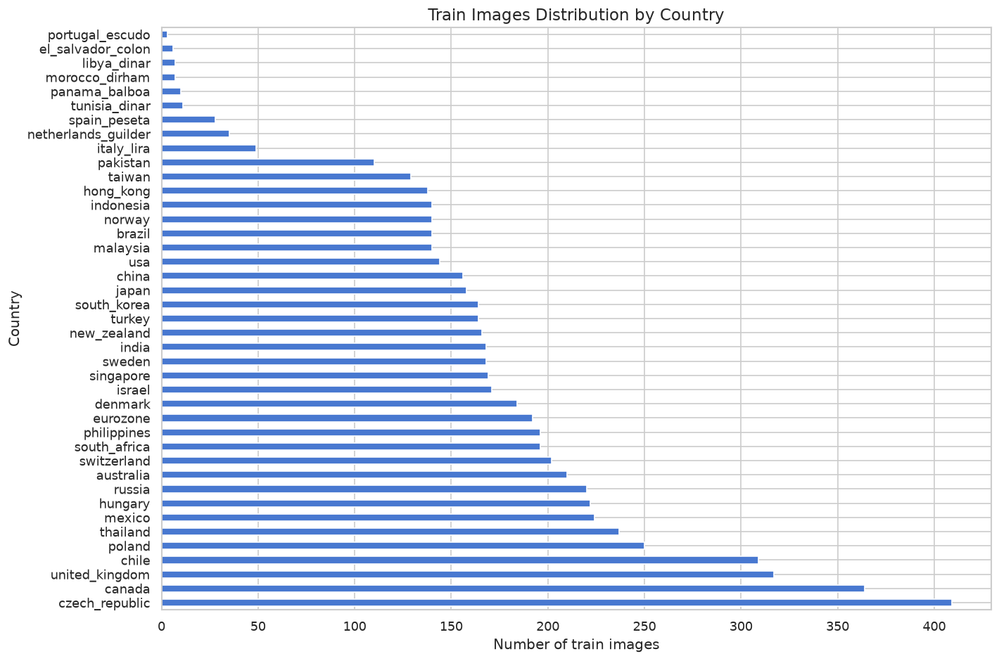

In [12]:
country_counts = classes_df.groupby("country")["train_images"].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
country_counts.plot(kind="barh", color=sns.color_palette("muted")[0])
plt.xlabel("Number of train images")
plt.ylabel("Country")
plt.title("Train Images Distribution by Country")
plt.tight_layout()
plt.show()

## Distribution by Denomination Value

Groups classes by their numeric denomination value (1, 5, 10, 25, etc.).

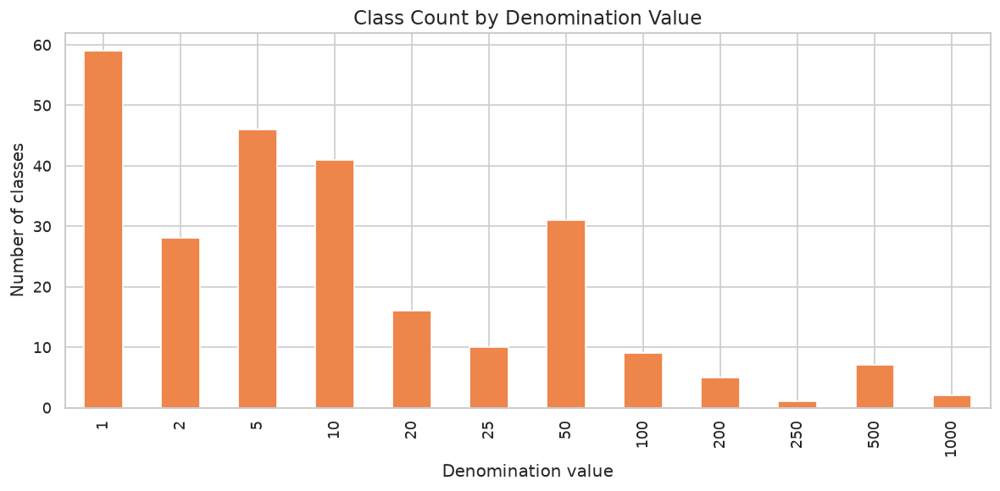

In [13]:
classes_df["denom_value"] = classes_df["denomination"].str.extract(r"^(\d+)")
denom_counts = classes_df["denom_value"].value_counts().sort_index(key=lambda x: x.astype(int))

plt.figure(figsize=(10, 5))
denom_counts.plot(kind="bar", color=sns.color_palette("muted")[1])
plt.xlabel("Denomination value")
plt.ylabel("Number of classes")
plt.title("Class Count by Denomination Value")
plt.tight_layout()
plt.show()

## Class Balance

Identifies the most and least represented classes to spot imbalance.

In [14]:
print("Train images per class - min:", classes_df["train_images"].min(),
      "max:", classes_df["train_images"].max(),
      "mean:", round(classes_df["train_images"].mean(), 2))

print("\nTop 5 most represented classes:")
print(classes_df.nlargest(5, "train_images")[["class_id", "denomination", "country", "train_images"]])

print("\nTop 5 least represented classes:")
print(classes_df.nsmallest(5, "train_images")[["class_id", "denomination", "country", "train_images"]])

Train images per class - min: 1 max: 52 mean: 25.11

Top 5 most represented classes:
    class_id denomination         country  train_images
17        18     20 Pence  united_kingdom            52
18        19     50 Pence  united_kingdom            52
19        20      1 Pound  united_kingdom            52
20        21     2 Pounds  united_kingdom            52
21        22       1 Cent          canada            52

Top 5 least represented classes:
     class_id denomination              country  train_images
212       213    5 Pesetas         spain_peseta             1
214       217  100 Pesetas         spain_peseta             1
215       229       5 Cent  netherlands_guilder             1
216       230      10 Cent  netherlands_guilder             1
217       214   10 Pesetas         spain_peseta             1


## Class Histogram

Visualizes class imbalance by plotting image count per class, sorted.

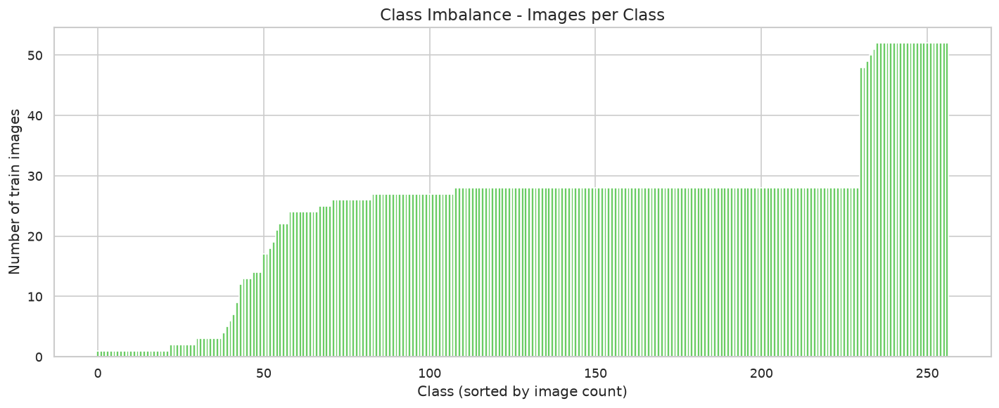

In [15]:
plt.figure(figsize=(12, 5))
plt.bar(range(len(classes_df)), classes_df.sort_values("train_images")["train_images"],
        color=sns.color_palette("muted")[2])
plt.xlabel("Class (sorted by image count)")
plt.ylabel("Number of train images")
plt.title("Class Imbalance - Images per Class")
plt.tight_layout()
plt.show()

## Scan Image Resolutions

Reads every train image to record its width, height, and file size (may take a minute).

In [16]:
resolution_data = []

for class_id in os.listdir(TRAIN_DIR):
    class_path = os.path.join(TRAIN_DIR, class_id)
    if not os.path.isdir(class_path):
        continue
    for filename in os.listdir(class_path):
        file_path = os.path.join(class_path, filename)
        try:
            with Image.open(file_path) as img:
                width, height = img.size
            file_size = os.path.getsize(file_path) / 1024
            resolution_data.append({
                "class_id": class_id, "filename": filename,
                "width": width, "height": height,
                "file_size_kb": round(file_size, 1)
            })
        except Exception:
            resolution_data.append({
                "class_id": class_id, "filename": filename,
                "width": None, "height": None, "file_size_kb": None
            })

resolutions_df = pd.DataFrame(resolution_data)
print("Total images scanned:", len(resolutions_df))
resolutions_df.head()

Total images scanned: 6453


,class_id,filename,width,height,file_size_kb
0,1,001__1 Cent_australia.jpg,499,499,62.2
1,1,002__1 Cent_australia.jpg,474,474,51.8
2,1,004__1 Cent_australia.jpg,409,409,60.9
3,1,005__1 Cent_australia.jpg,409,409,60.9
4,1,007__1 Cent_australia.jpg,229,213,22.7


## Resolution Distribution

Plots the spread of image widths and heights.

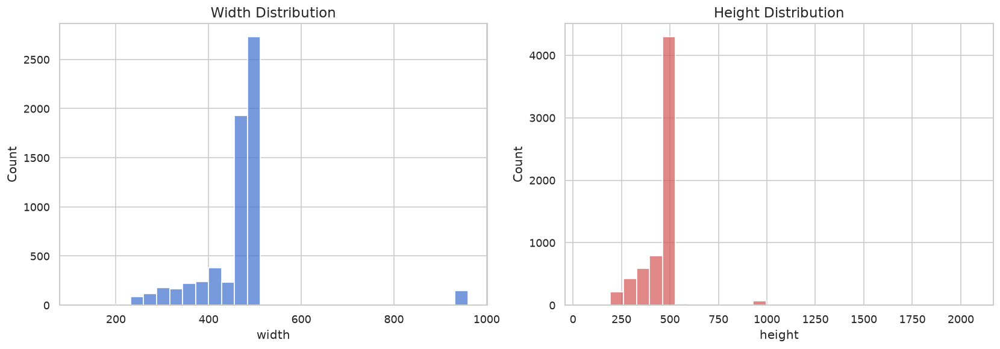

Most common resolution: (np.int64(500), np.int64(500))


In [17]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.histplot(resolutions_df["width"].dropna(), bins=30, ax=axes[0], color=sns.color_palette("muted")[0])
axes[0].set_title("Width Distribution")

sns.histplot(resolutions_df["height"].dropna(), bins=30, ax=axes[1], color=sns.color_palette("muted")[3])
axes[1].set_title("Height Distribution")

plt.tight_layout()
plt.show()

print("Most common resolution:", resolutions_df.groupby(["width", "height"]).size().idxmax())

## Check for Corrupted Images

Flags any image that failed to open during the resolution scan.

In [18]:
corrupted = resolutions_df[resolutions_df["width"].isna()]
print("Corrupted or unreadable images found:", len(corrupted))
if len(corrupted) > 0:
    print(corrupted[["class_id", "filename"]])

Corrupted or unreadable images found: 0


## Detect Duplicate Images

Hashes every file to find exact duplicate images across classes.

In [19]:
def get_file_hash(file_path):
    with open(file_path, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hashes = {}
duplicates = []

for class_id in os.listdir(TRAIN_DIR):
    class_path = os.path.join(TRAIN_DIR, class_id)
    if not os.path.isdir(class_path):
        continue
    for filename in os.listdir(class_path):
        file_path = os.path.join(class_path, filename)
        file_hash = get_file_hash(file_path)
        if file_hash in hashes:
            duplicates.append((hashes[file_hash], f"{class_id}/{filename}"))
        else:
            hashes[file_hash] = f"{class_id}/{filename}"

print("Duplicate images found:", len(duplicates))
for original, duplicate in duplicates[:10]:
    print(f"{original}  <-->  {duplicate}")

Duplicate images found: 2102
1/004__1 Cent_australia.jpg  <-->  1/005__1 Cent_australia.jpg
1/009__1 Cent_australia.jpg  <-->  1/011__1 Cent_australia.jpg
1/008__1 Cent_australia.jpg  <-->  1/012__1 Cent_australia.jpg
1/009__1 Cent_australia.jpg  <-->  1/014__1 Cent_australia.jpg
1/010__1 Cent_australia.jpg  <-->  1/017__1 Cent_australia.jpg
1/009__1 Cent_australia.jpg  <-->  1/018__1 Cent_australia.jpg
1/008__1 Cent_australia.jpg  <-->  1/025__1 Cent_australia.jpg
1/010__1 Cent_australia.jpg  <-->  1/028__1 Cent_australia.jpg
1/004__1 Cent_australia.jpg  <-->  1/029__1 Cent_australia.jpg
10/003__5 Centavos_brazil.jpg  <-->  10/010__5 Centavos_brazil.jpg


## Example Images per Class

Displays sample images from 5 random classes to visually check labeling.

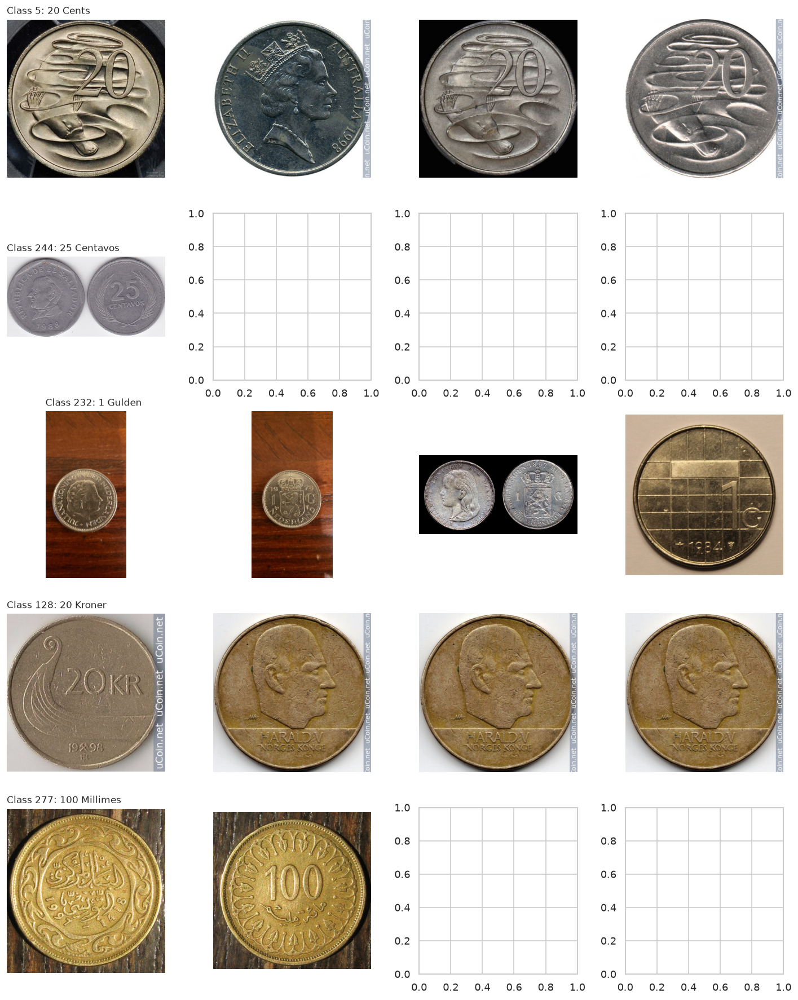

In [20]:
sample_classes = random.sample(os.listdir(TRAIN_DIR), 5)

fig, axes = plt.subplots(5, 4, figsize=(12, 15))

for row, class_id in enumerate(sample_classes):
    class_path = os.path.join(TRAIN_DIR, class_id)
    images = os.listdir(class_path)[:4]
    class_label = classes_df.loc[classes_df["class_id"].astype(str) == class_id, "denomination"].values[0]
    for col, img_name in enumerate(images):
        img = Image.open(os.path.join(class_path, img_name))
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
    axes[row, 0].set_title(f"Class {class_id}: {class_label}", loc="left", fontsize=10)

plt.tight_layout()
plt.show()

## Random Image Matrix

Shows a grid of 16 random images sampled from across the whole dataset.

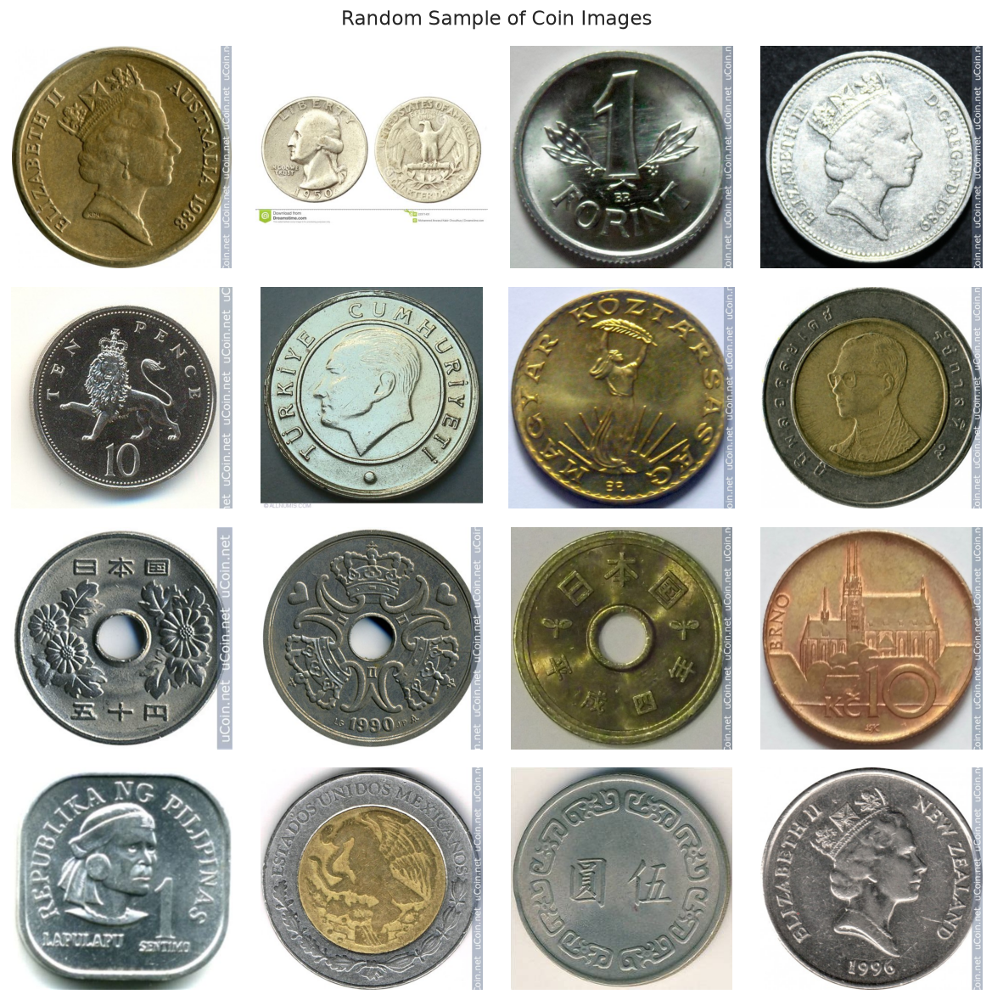

In [21]:
all_images = []
for class_id in os.listdir(TRAIN_DIR):
    class_path = os.path.join(TRAIN_DIR, class_id)
    for filename in os.listdir(class_path):
        all_images.append(os.path.join(class_path, filename))

random_sample = random.sample(all_images, 16)

fig, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), random_sample):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis("off")

plt.suptitle("Random Sample of Coin Images", fontsize=14)
plt.tight_layout()
plt.show()

In [22]:
resolutions_df.to_csv(os.path.join(DATA_DIR, "image_resolutions.csv"), index=False)
print("Saved:", os.path.join(DATA_DIR, "image_resolutions.csv"))
print("\nEDA Summary:")
print(f"- Total images analyzed: {len(resolutions_df)}")
print(f"- Corrupted images: {len(corrupted)}")
print(f"- Duplicate images: {len(duplicates)}")
print(f"- Most common resolution: {resolutions_df.groupby(['width','height']).size().idxmax()}")

Saved: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\data\image_resolutions.csv

EDA Summary:
- Total images analyzed: 6453
- Corrupted images: 0
- Duplicate images: 2102
- Most common resolution: (np.int64(500), np.int64(500))


## Reload Paths and Imports

Reloads project paths and imports libraries needed for preprocessing and transforms.

In [23]:
import os
import json
import hashlib
import pandas as pd
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

DATA_DIR = r"C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\data"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TEST_DIR = os.path.join(DATA_DIR, "test")
classes_df = pd.read_csv(os.path.join(DATA_DIR, "class_dictionary.csv"))

## Check for Cross-Class Duplicate Images

Verifies whether any duplicate image appears under two different class labels, which would indicate a labeling conflict.

In [24]:
def get_file_hash(file_path):
    with open(file_path, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hash_to_classes = {}

for class_id in os.listdir(TRAIN_DIR):
    class_path = os.path.join(TRAIN_DIR, class_id)
    if not os.path.isdir(class_path):
        continue
    for filename in os.listdir(class_path):
        file_hash = get_file_hash(os.path.join(class_path, filename))
        hash_to_classes.setdefault(file_hash, set()).add(class_id)

cross_class_conflicts = {h: c for h, c in hash_to_classes.items() if len(c) > 1}

print("Cross-class duplicate conflicts found:", len(cross_class_conflicts))
if cross_class_conflicts:
    print("WARNING: some images appear under multiple classes:")
    for h, c in list(cross_class_conflicts.items())[:10]:
        print(c)
else:
    print("All duplicates are within the same class - safe to keep them as-is.")

Cross-class duplicate conflicts found: 0
All duplicates are within the same class - safe to keep them as-is.


## Verify Class Label Consistency

Checks that train, test, and the class dictionary all reference the exact same set of class IDs.

In [25]:
train_classes = set(os.listdir(TRAIN_DIR))
test_classes = set(os.listdir(TEST_DIR))
dict_classes = set(classes_df["class_id"].astype(str))

print("Train / Test / Dictionary all match:", train_classes == test_classes == dict_classes)
print("Missing in test:", train_classes - test_classes)
print("Missing in dictionary:", train_classes - dict_classes)

Train / Test / Dictionary all match: True
Missing in test: set()
Missing in dictionary: set()


## Check Train-Test Leakage

Verifies no identical image appears in both train and test folders, which would leak information into evaluation.

In [26]:
train_hashes = set(hash_to_classes.keys())

test_hash_to_files = {}
for class_id in os.listdir(TEST_DIR):
    class_path = os.path.join(TEST_DIR, class_id)
    if not os.path.isdir(class_path):
        continue
    for filename in os.listdir(class_path):
        file_hash = get_file_hash(os.path.join(class_path, filename))
        test_hash_to_files.setdefault(file_hash, []).append(f"{class_id}/{filename}")

leaked_hashes = train_hashes.intersection(test_hash_to_files.keys())
print("Train-test leaked images found:", len(leaked_hashes))

Train-test leaked images found: 347


## Remove Cross-Class Conflicting Images

Builds a set of "bad" file paths involved in cross-class conflicts and prepares it for exclusion from the manifest.

In [27]:
bad_hashes = set(cross_class_conflicts.keys()) | leaked_hashes

bad_file_paths = set()
for class_id in os.listdir(TRAIN_DIR):
    class_path = os.path.join(TRAIN_DIR, class_id)
    if not os.path.isdir(class_path):
        continue
    for filename in os.listdir(class_path):
        file_path = os.path.join(class_path, filename)
        if get_file_hash(file_path) in bad_hashes:
            bad_file_paths.add(file_path)

print("Total conflicting images to exclude:", len(bad_file_paths))

Total conflicting images to exclude: 1116


## Build Full Image Manifest

Creates one row per image with its file path, class ID, and metadata, for both train and test.

In [28]:
def build_manifest(base_dir, split_name, exclude_paths=None):
    exclude_paths = exclude_paths or set()
    rows = []
    for class_id in os.listdir(base_dir):
        class_path = os.path.join(base_dir, class_id)
        if not os.path.isdir(class_path):
            continue
        for filename in os.listdir(class_path):
            file_path = os.path.join(class_path, filename)
            if file_path in exclude_paths:
                continue
            rows.append({
                "file_path": file_path,
                "class_id": int(class_id),
                "split": split_name
            })
    return pd.DataFrame(rows)

train_manifest = build_manifest(TRAIN_DIR, "train", exclude_paths=bad_file_paths)
test_manifest = build_manifest(TEST_DIR, "test")

print("Train images (after cleanup):", len(train_manifest))
print("Test images:", len(test_manifest))

Train images (after cleanup): 5337
Test images: 868


## Create Stratified Train/Validation Split

Splits the train manifest into train and validation sets, preserving class balance (85/15).

In [29]:
class_counts = train_manifest["class_id"].value_counts()
singleton_classes = class_counts[class_counts < 2].index
stratifiable = train_manifest[~train_manifest["class_id"].isin(singleton_classes)]
singleton_rows = train_manifest[train_manifest["class_id"].isin(singleton_classes)]

train_split, val_split = train_test_split(
    stratifiable,
    test_size=0.15,
    stratify=stratifiable["class_id"],
    random_state=42
)
train_split = pd.concat([train_split, singleton_rows], ignore_index=True)

val_split = val_split.copy()
val_split["split"] = "validation"

print("Final train images:", len(train_split))
print("Validation images:", len(val_split))
if len(singleton_classes) > 0:
    print(f"Clases con 1 sola foto de train (van completas a train, sin validation): {len(singleton_classes)}")
    print(sorted(singleton_classes.tolist()))

Final train images: 4539
Validation images: 798
Clases con 1 sola foto de train (van completas a train, sin validation): 22
[213, 214, 217, 222, 229, 230, 244, 250, 254, 255, 260, 264, 267, 268, 270, 271, 272, 278, 281, 282, 283, 286]


## Merge and Save Final Manifest

Combines train, validation, and test into one manifest CSV with denomination/country metadata.

In [30]:
full_manifest = pd.concat([train_split, val_split, test_manifest], ignore_index=True)
full_manifest = full_manifest.merge(classes_df, on="class_id", how="left")

OUTPUT_PATH = os.path.join(DATA_DIR, "dataset_manifest.csv")
full_manifest.to_csv(OUTPUT_PATH, index=False)

print("Saved:", OUTPUT_PATH)
print(full_manifest["split"].value_counts())

Saved: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\data\dataset_manifest.csv
split
train         4539
test           868
validation     798
Name: count, dtype: int64


## Add Gaussian Noise Transform

Custom transform to inject light noise (torchvision has no built-in noise transform). Now defined in `coin_dataset.py` and imported here, so it can be pickled by DataLoader worker processes.

In [31]:
# AddGaussianNoise now lives in coin_dataset.py (next to this notebook) instead of
# being defined here. Reason: PyTorch DataLoader workers (num_workers > 0) need to
# pickle/re-import every class used by the Dataset/transform pipeline. On Windows,
# multiprocessing uses "spawn", and classes defined inside a notebook cell live in
# __main__, which worker processes cannot re-import -> that's why num_workers=0 was
# used before. Moving the class to a real .py module fixes this.
import sys, os
sys.path.append(os.path.dirname(DATA_DIR))
from coin_dataset import AddGaussianNoise


## Define Training and Validation Transforms

Builds the augmentation pipeline for training (rotation, zoom, brightness, contrast, noise, blur, perspective) and a clean resize+normalize pipeline for validation/test. Uses ImageNet stats since EfficientNet-B3 is pretrained on ImageNet.

In [32]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(300, scale=(0.8, 1.0)),   # zoom
    transforms.RandomRotation(15),                          # rotation
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),  # perspective
    transforms.ColorJitter(brightness=0.2, contrast=0.2),   # brightness/contrast
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 1.0)),  # slight blur
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    AddGaussianNoise(std=0.02),                              # noise
])

val_test_transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

## Visualize Augmentation Effects

Displays one original image next to five augmented versions to confirm the pipeline looks correct.

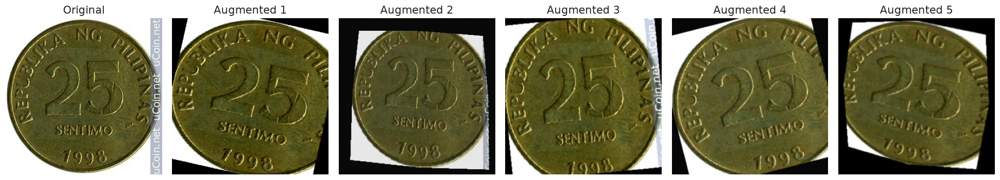

In [33]:
sample_path = full_manifest[full_manifest["split"] == "train"]["file_path"].iloc[0]
original_img = Image.open(sample_path).convert("RGB")

fig, axes = plt.subplots(1, 6, figsize=(18, 4))
axes[0].imshow(original_img)
axes[0].set_title("Original")
axes[0].axis("off")

def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()

for i in range(1, 6):
    augmented = train_transform(original_img)
    axes[i].imshow(denormalize(augmented))
    axes[i].set_title(f"Augmented {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

In [34]:
print(f"- Manifest saved with {len(full_manifest)} total images")
print(f"- Train: {len(train_split)} | Validation: {len(val_split)} | Test: {len(test_manifest)}")
print(f"- Cross-class conflicts: {len(cross_class_conflicts)}")
print(f"- Class label consistency: {train_classes == test_classes == dict_classes}")
print("- Transforms defined: train_transform (augmented), val_test_transform (clean)")

- Manifest saved with 6205 total images
- Train: 4539 | Validation: 798 | Test: 868
- Cross-class conflicts: 0
- Class label consistency: True
- Transforms defined: train_transform (augmented), val_test_transform (clean)


In [35]:
"Check minimum images per class after cleanup"
min_per_class = train_manifest["class_id"].value_counts().min()
print("Minimum images per class after cleanup:", min_per_class)
if min_per_class < 5:
    print("WARNING: some classes have very few images - consider stronger augmentation in Phase 6.")

Minimum images per class after cleanup: 1


## Reload Manifest and Imports

Reloads the cleaned manifest and imports the libraries needed to build the PyTorch Dataset.

In [36]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt

DATA_DIR = r"C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\data"
full_manifest = pd.read_csv(os.path.join(DATA_DIR, "dataset_manifest.csv"))

# Make coin_dataset.py importable (same folder as this notebook) in case this cell
# is run after a kernel restart, before cells 1-59 defined sys.path already.
import sys
sys.path.append(os.path.dirname(DATA_DIR))

full_manifest.head()

,file_path,class_id,split,denomination,currency,country,train_images,test_images
0,C:\Users\arnol\OneDrive\Documentos\Progaming\D...,136,train,25 Sentimos,Philipine peso,philippines,28,4
1,C:\Users\arnol\OneDrive\Documentos\Progaming\D...,71,train,20 Forint,Hungarian Forint,hungary,27,4
2,C:\Users\arnol\OneDrive\Documentos\Progaming\D...,133,train,1 Sentimo,Philipine peso,philippines,28,4
3,C:\Users\arnol\OneDrive\Documentos\Progaming\D...,33,train,100 Pesos,Chilean Peso,chile,51,4
4,C:\Users\arnol\OneDrive\Documentos\Progaming\D...,126,train,5 Kroner,Norwegian Krone,norway,28,4


## Create Label Mapping

Maps the original class_id (1-211) to a contiguous index (0-210) required by CrossEntropyLoss, and saves it for later use in prediction.

In [37]:
sorted_classes = sorted(int(x) for x in full_manifest["class_id"].unique())
class_to_idx = {class_id: idx for idx, class_id in enumerate(sorted_classes)}
idx_to_class = {idx: class_id for class_id, idx in class_to_idx.items()}

full_manifest["label_idx"] = full_manifest["class_id"].map(class_to_idx)

import json
with open(os.path.join(DATA_DIR, "label_mapping.json"), "w") as f:
    json.dump({"class_to_idx": {str(k): v for k, v in class_to_idx.items()},
               "idx_to_class": {str(k): v for k, v in idx_to_class.items()}}, f, indent=2)

print("Total classes mapped:", len(class_to_idx))
print("Saved label_mapping.json")

Total classes mapped: 257
Saved label_mapping.json


## Define CoinDataset Class

Custom PyTorch Dataset that loads an image from disk, applies the transform, and returns it with its label index. Now defined in `coin_dataset.py` and imported here (same reason as `AddGaussianNoise`).

In [38]:
# CoinDataset now lives in coin_dataset.py (same reason as AddGaussianNoise above:
# it must be importable from a real module for num_workers > 0 to work on Windows).
from coin_dataset import CoinDataset


## Instantiate Datasets

Creates train, validation, and test datasets, applying augmentation only to train.

In [39]:
train_dataset = CoinDataset(full_manifest, split="train", transform=train_transform)
val_dataset = CoinDataset(full_manifest, split="validation", transform=val_test_transform)
test_dataset = CoinDataset(full_manifest, split="test", transform=val_test_transform)

print("Train samples:", len(train_dataset))
print("Validation samples:", len(val_dataset))
print("Test samples:", len(test_dataset))

Train samples: 4539
Validation samples: 798
Test samples: 868


## Sanity Check on One Sample

Loads a single sample to confirm the image tensor shape and label type are correct.

In [40]:
sample_image, sample_label = train_dataset[0]
print("Image tensor shape:", sample_image.shape)
print("Image dtype:", sample_image.dtype)
print("Label index:", sample_label, "-> original class_id:", idx_to_class[sample_label])

Image tensor shape: torch.Size([3, 300, 300])
Image dtype: torch.float32
Label index: 135 -> original class_id: 136


## Create DataLoaders

Wraps each dataset in a DataLoader. Batch size kept at 16 due to the 4GB VRAM limit. `num_workers` now runs in parallel (was 0) — safe because `CoinDataset`/`AddGaussianNoise` moved to `coin_dataset.py` so worker processes can import them on Windows.

In [41]:
BATCH_SIZE = 16

# Parallel data loading: was num_workers=0 (single-threaded PIL + augmentation on the
# main process, GPU sits idle waiting for each batch). Now safe on Windows because
# CoinDataset/AddGaussianNoise are importable from coin_dataset.py (see cells above).
# Capped at 6 workers so it doesn't over-subscribe a laptop CPU / RAM for image buffers.
NUM_WORKERS = min(6, max(1, (os.cpu_count() or 4) - 1))

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=True, persistent_workers=(NUM_WORKERS > 0),
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True, persistent_workers=(NUM_WORKERS > 0),
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True, persistent_workers=(NUM_WORKERS > 0),
)

print(f"NUM_WORKERS = {NUM_WORKERS} (parallel data loading)")
print("Batches per epoch - train:", len(train_loader))
print("Batches per epoch - validation:", len(val_loader))
print("Batches per epoch - test:", len(test_loader))


NUM_WORKERS = 6 (parallel data loading)
Batches per epoch - train: 284
Batches per epoch - validation: 50
Batches per epoch - test: 55


## Visualize One Training Batch

Pulls one batch from the train loader and displays it with denormalized colors to confirm the pipeline works end-to-end.

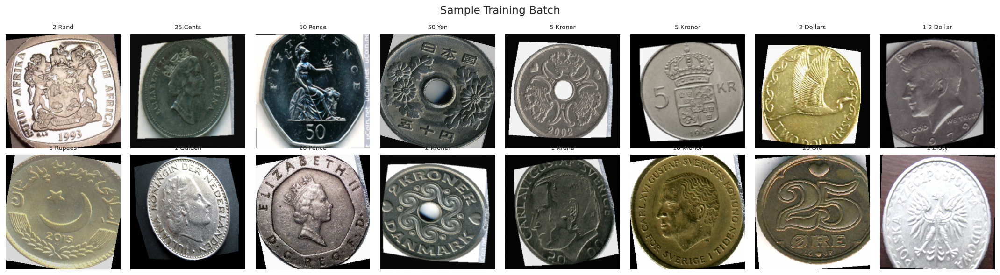

In [42]:
def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()

images, labels = next(iter(train_loader))

fig, axes = plt.subplots(2, 8, figsize=(18, 5))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(denormalize(images[i]))
    class_id = idx_to_class[labels[i].item()]
    denom = full_manifest.loc[full_manifest["class_id"] == class_id, "denomination"].iloc[0]
    ax.set_title(denom, fontsize=8)
    ax.axis("off")

plt.suptitle("Sample Training Batch", fontsize=14)
plt.tight_layout()
plt.show()

In [43]:
print("Phase 4 Summary:")
print(f"- CoinDataset created for train/validation/test")
print(f"- Batch size: {BATCH_SIZE} | Shuffle (train only): True | num_workers: 0")
print(f"- label_mapping.json saved with {len(class_to_idx)} classes")
print(f"- Batches per epoch: train={len(train_loader)}, val={len(val_loader)}, test={len(test_loader)}")

Phase 4 Summary:
- CoinDataset created for train/validation/test
- Batch size: 16 | Shuffle (train only): True | num_workers: 0
- label_mapping.json saved with 257 classes
- Batches per epoch: train=284, val=50, test=55


## Model Architecture (EfficientNet-B3)

Load a pretrained EfficientNet-B3 and adapt its classifier head for 211 coin classes.

In [44]:
# Import required libraries for model building
import torch
import torch.nn as nn
from torchvision import models

# Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM available: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

# Fixed input size (300x300) every batch -> let cuDNN pick the fastest conv
# algorithms for that shape instead of re-benchmarking on the fly. Free speed win,
# does not change training results.
torch.backends.cudnn.benchmark = True


Using device: cuda
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU
VRAM available: 4.29 GB


## Load Pretrained EfficientNet-B3
Loads EfficientNet-B3 with ImageNet weights as the base for transfer learning.

In [45]:
weights = models.EfficientNet_B3_Weights.DEFAULT
model = models.efficientnet_b3(weights=weights)

print("Model loaded: EfficientNet-B3")
print("Classifier head (original):", model.classifier)

Model loaded: EfficientNet-B3
Classifier head (original): Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1536, out_features=1000, bias=True)
)


## Freeze Base Layers
Freezes all convolutional feature layers so only the new classifier head will be trained.

In [46]:
for param in model.features.parameters():
    param.requires_grad = False

print("Base feature layers frozen")

Base feature layers frozen


## Replace Classifier Head
Swaps the original 1000-class ImageNet head for a new head matching our 211 coin classes.

In [47]:
# Get number of classes from the label mapping
num_classes = len(class_to_idx)

# Get input size of the original classifier layer
in_features = model.classifier[1].in_features

# Replace classifier with a new head for 211 coin classes
model.classifier = nn.Sequential(
    nn.Dropout(p=0.4, inplace=True),
    nn.Linear(in_features, num_classes)
)

print("New classifier head:", model.classifier)
print("Number of output classes:", num_classes)

New classifier head: Sequential(
  (0): Dropout(p=0.4, inplace=True)
  (1): Linear(in_features=1536, out_features=257, bias=True)
)
Number of output classes: 257


## Move Model to GPU
Sends the model to the GPU (or CPU as fallback) for training.

In [48]:
# Move model to the selected device
model = model.to(device)
print(f"Model moved to: {device}")

Model moved to: cuda


## Verify Trainable Parameters
Confirms how many parameters are trainable versus frozen, to validate the transfer learning setup.

In [49]:
# Count total, trainable and frozen parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Frozen parameters: {total_params - trainable_params:,}")

Total parameters: 11,091,241
Trainable parameters: 395,009
Frozen parameters: 10,696,232


## Define Loss Function and Optimizer
Sets up CrossEntropyLoss for multi-class classification and Adam optimizer for the trainable classifier head only.

In [50]:
# Loss function for multi-class classification
criterion = nn.CrossEntropyLoss()

# Optimizer: only update parameters that require gradients (the classifier head)
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-3
)

print("Loss function:", criterion)
print("Optimizer: Adam, lr=1e-3, training only the classifier head")

Loss function: CrossEntropyLoss()
Optimizer: Adam, lr=1e-3, training only the classifier head


## Define Learning Rate Scheduler
Reduces the learning rate automatically when validation loss stops improving.

In [51]:
# Scheduler: reduce LR by half if val_loss does not improve for 3 epochs
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)

print("Scheduler ready: ReduceLROnPlateau (factor=0.5, patience=3)")

Scheduler ready: ReduceLROnPlateau (factor=0.5, patience=3)


## Setup Mixed Precision (AMP)
Enables mixed precision training to reduce VRAM usage and speed up training on the 4GB GPU.

In [52]:
# Gradient scaler for automatic mixed precision
scaler = torch.amp.GradScaler("cuda")

print("Mixed precision (AMP) enabled")

Mixed precision (AMP) enabled


## Define Training Function (One Epoch)
Runs one full pass over the training data, updating only the classifier head weights.

In [53]:
def train_one_epoch(model, loader, criterion, optimizer, scaler, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

        optimizer.zero_grad()

        # Forward pass with mixed precision
        with torch.amp.autocast("cuda"):
            outputs = model(images)
            loss = criterion(outputs, labels)

        # Backward pass with scaled gradients
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

## Define Validation Function
Evaluates the model on the validation set without updating any weights.

In [54]:
def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)

            # autocast is safe here: no backward pass / gradient scaling involved,
            # this only speeds up the forward pass on the GPU.
            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                outputs = model(images)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc


## Setup Checkpoint Path
Creates a models folder and defines where the best model weights will be saved.

In [55]:
# Create a models folder next to the data folder
MODELS_DIR = os.path.join(os.path.dirname(DATA_DIR), "models")
os.makedirs(MODELS_DIR, exist_ok=True)

CHECKPOINT_PATH = os.path.join(MODELS_DIR, "best_model.pth")
print("Checkpoint will be saved to:", CHECKPOINT_PATH)

Checkpoint will be saved to: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\models\best_model.pth


## Training Loop
Trains the model for 20 epochs, tracking loss and accuracy, and saving the best checkpoint by validation accuracy.

In [56]:
import time
from tqdm import tqdm

NUM_EPOCHS = 20
best_val_acc = 0.0

history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

start_time = time.time()

for epoch in tqdm(range(1, NUM_EPOCHS + 1), desc="Training"):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, scaler, device)
    val_loss, val_acc = validate_one_epoch(model, val_loader, criterion, device)

    scheduler.step(val_loss)

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    # Save checkpoint if validation accuracy improved
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), CHECKPOINT_PATH)
        marker = "  <- best so far, saved"
    else:
        marker = ""

    print(f"Epoch {epoch}/{NUM_EPOCHS} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}{marker}")

total_time = time.time() - start_time
print(f"\nTraining completed in {total_time/60:.1f} minutes")
print(f"Best validation accuracy: {best_val_acc:.4f}")

Training:   5%|▌         | 1/20 [00:50<16:03, 50.71s/it]

Epoch 1/20 | Train Loss: 4.7229 Acc: 0.1648 | Val Loss: 3.8331 Acc: 0.4023  <- best so far, saved


Training:  10%|█         | 2/20 [01:14<10:25, 34.77s/it]

Epoch 2/20 | Train Loss: 3.1780 Acc: 0.4611 | Val Loss: 3.0021 Acc: 0.5150  <- best so far, saved


Training:  15%|█▌        | 3/20 [01:38<08:25, 29.73s/it]

Epoch 3/20 | Train Loss: 2.4211 Acc: 0.5955 | Val Loss: nan Acc: 0.5777  <- best so far, saved


Training:  20%|██        | 4/20 [02:01<07:18, 27.43s/it]

Epoch 4/20 | Train Loss: 1.9834 Acc: 0.6512 | Val Loss: 2.2233 Acc: 0.6103  <- best so far, saved


Training:  25%|██▌       | 5/20 [02:26<06:34, 26.28s/it]

Epoch 5/20 | Train Loss: 1.6965 Acc: 0.6858 | Val Loss: 2.0014 Acc: 0.6391  <- best so far, saved


Training:  30%|███       | 6/20 [02:50<05:57, 25.53s/it]

Epoch 6/20 | Train Loss: 1.4895 Acc: 0.7076 | Val Loss: 1.9090 Acc: 0.6404  <- best so far, saved


Training:  35%|███▌      | 7/20 [03:14<05:26, 25.14s/it]

Epoch 7/20 | Train Loss: 1.3598 Acc: 0.7354 | Val Loss: 1.7348 Acc: 0.6742  <- best so far, saved


Training:  40%|████      | 8/20 [03:38<04:57, 24.83s/it]

Epoch 8/20 | Train Loss: 1.2067 Acc: 0.7687 | Val Loss: 1.8243 Acc: 0.6529


Training:  45%|████▌     | 9/20 [04:03<04:32, 24.73s/it]

Epoch 9/20 | Train Loss: 1.1021 Acc: 0.7803 | Val Loss: 1.9013 Acc: 0.6729


Training:  50%|█████     | 10/20 [04:27<04:07, 24.70s/it]

Epoch 10/20 | Train Loss: 1.0299 Acc: 0.7916 | Val Loss: 1.5891 Acc: 0.6867  <- best so far, saved


Training:  55%|█████▌    | 11/20 [04:52<03:42, 24.74s/it]

Epoch 11/20 | Train Loss: 0.9339 Acc: 0.8149 | Val Loss: 1.5953 Acc: 0.6754


Training:  60%|██████    | 12/20 [05:18<03:19, 24.93s/it]

Epoch 12/20 | Train Loss: 0.8876 Acc: 0.8147 | Val Loss: 1.5202 Acc: 0.6955  <- best so far, saved


Training:  65%|██████▌   | 13/20 [05:45<02:59, 25.64s/it]

Epoch 13/20 | Train Loss: 0.8352 Acc: 0.8260 | Val Loss: 1.6509 Acc: 0.6880


Training:  70%|███████   | 14/20 [06:14<02:39, 26.58s/it]

Epoch 14/20 | Train Loss: 0.7883 Acc: 0.8367 | Val Loss: 1.4577 Acc: 0.7055  <- best so far, saved


Training:  75%|███████▌  | 15/20 [06:45<02:19, 27.92s/it]

Epoch 15/20 | Train Loss: 0.7591 Acc: 0.8350 | Val Loss: 1.4103 Acc: 0.7143  <- best so far, saved


Training:  80%|████████  | 16/20 [07:19<01:59, 29.96s/it]

Epoch 16/20 | Train Loss: 0.7169 Acc: 0.8390 | Val Loss: 1.3949 Acc: 0.7018


Training:  85%|████████▌ | 17/20 [07:55<01:35, 31.74s/it]

Epoch 17/20 | Train Loss: 0.7049 Acc: 0.8469 | Val Loss: 1.3127 Acc: 0.7055


Training:  90%|█████████ | 18/20 [08:34<01:07, 33.97s/it]

Epoch 18/20 | Train Loss: 0.6646 Acc: 0.8553 | Val Loss: 1.3663 Acc: 0.7231  <- best so far, saved


Training:  95%|█████████▌| 19/20 [09:16<00:36, 36.28s/it]

Epoch 19/20 | Train Loss: 0.6413 Acc: 0.8568 | Val Loss: 1.6815 Acc: 0.7030


Training: 100%|██████████| 20/20 [10:01<00:00, 30.07s/it]

Epoch 20/20 | Train Loss: 0.6179 Acc: 0.8605 | Val Loss: 1.3720 Acc: 0.7180

Training completed in 10.0 minutes
Best validation accuracy: 0.7231


## Plot Training Curves
Visualizes loss and accuracy over epochs for train and validation sets.

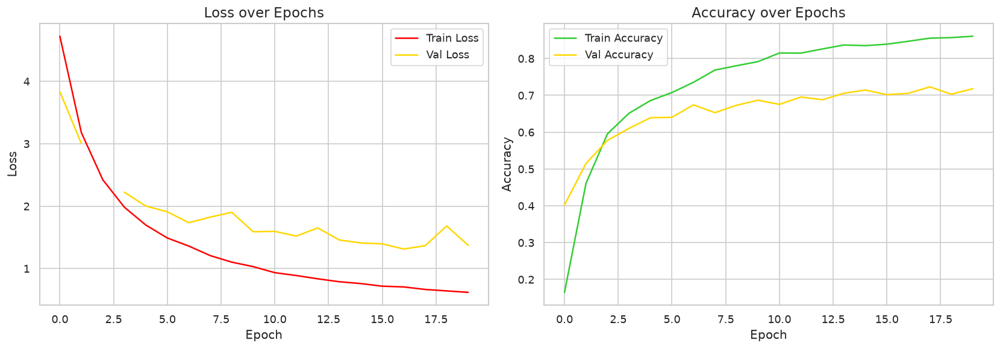

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history["train_loss"], label="Train Loss", color="red")
axes[0].plot(history["val_loss"], label="Val Loss", color="gold")
axes[0].set_title("Loss over Epochs")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].legend()

axes[1].plot(history["train_acc"], label="Train Accuracy", color="limegreen")
axes[1].plot(history["val_acc"], label="Val Accuracy", color="gold")
axes[1].set_title("Accuracy over Epochs")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Accuracy")
axes[1].legend()

plt.tight_layout()
plt.show()

## Prints a summary of the training results.

In [58]:
print(f"- Epochs trained: {NUM_EPOCHS}")
print(f"- Best validation accuracy: {best_val_acc:.4f}")
print(f"- Best model saved at: {CHECKPOINT_PATH}")
print(f"- Final train loss: {history['train_loss'][-1]:.4f} | Final val loss: {history['val_loss'][-1]:.4f}")

- Epochs trained: 20
- Best validation accuracy: 0.7231
- Best model saved at: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\models\best_model.pth
- Final train loss: 0.6179 | Final val loss: 1.3720


## Load Best Checkpoint
Loads the saved weights with the highest validation accuracy and sets the model to evaluation mode.

In [59]:
model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model.eval()

print("Best checkpoint loaded from:", CHECKPOINT_PATH)

Best checkpoint loaded from: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\models\best_model.pth


## Evaluate on Test Set
Runs the model on the test set to get the final, unbiased loss and accuracy.

In [60]:
test_loss, test_acc = validate_one_epoch(model, test_loader, criterion, device)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

Test Loss: 3.5069
Test Accuracy: 0.6256


## Collect Predictions and Confidences
Runs inference on the full test set and stores predicted labels, true labels, and confidence scores for later analysis.

In [61]:
all_preds = []
all_labels = []
all_confidences = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)

        with torch.amp.autocast("cuda"):
            outputs = model(images)

        probs = torch.softmax(outputs, dim=1)
        confidences, predicted = torch.max(probs, dim=1)

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_confidences.extend(confidences.cpu().numpy())

print(f"Collected {len(all_preds)} predictions")

Collected 868 predictions


## Per-Class Classification Report
Computes precision, recall, and f1-score for each of the 211 coin classes.

In [62]:
from sklearn.metrics import classification_report

# Map class indices back to readable coin names
idx_to_class = {v: k for k, v in class_to_idx.items()}
labels_present = sorted(set(all_labels) | set(all_preds))
target_names = [cat_to_name.get(str(idx_to_class[i]), str(idx_to_class[i])) for i in labels_present]

missing = num_classes - len(labels_present)
if missing > 0:
    print(f"Aviso: {missing} clase(s) no aparecen en el test set (muy pocas fotos), se excluyen del reporte.")

report = classification_report(all_labels, all_preds, labels=labels_present, target_names=target_names, output_dict=True, zero_division=0)
report_df = pd.DataFrame(report).transpose()
report_df.head(20)

Aviso: 19 clase(s) no aparecen en el test set (muy pocas fotos), se excluyen del reporte.


,precision,recall,f1-score,support
"1 Cent,Australian dollar,australia",1.000000,1.00,1.000000,4.0
"2 Cents,Australian dollar,australia",0.333333,0.50,0.400000,4.0
"5 Cents,Australian dollar,australia",0.333333,0.25,0.285714,4.0
"10 Cents,Australian dollar,australia",1.000000,0.25,0.400000,4.0
"20 Cents,Australian dollar,australia",0.500000,0.50,0.500000,4.0
"50 Cents,Australian dollar,australia",0.750000,0.75,0.750000,4.0
"1 Dollar,Australian dollar,australia",0.666667,0.50,0.571429,4.0
"2 Dollars,Australian dollar,australia",1.000000,0.75,0.857143,4.0
"1 Centavo,Brazilian Real,brazil",0.285714,0.50,0.363636,4.0
"5 Centavos,Brazilian Real,brazil",1.000000,0.50,0.666667,4.0


## Worst Performing Classes
Shows the 15 classes with the lowest f1-score, to spot where the model struggles most.

In [63]:
per_class_df = report_df.drop(["accuracy", "macro avg", "weighted avg"], errors="ignore")
worst_classes = per_class_df.sort_values("f1-score").head(15)

worst_classes[["precision", "recall", "f1-score", "support"]]

,precision,recall,f1-score,support
"1 Real,Brazilian Real,brazil",0.0,0.0,0.0,4.0
"2 Kroner,Danish Krone,denmark",0.0,0.0,0.0,3.0
"1 Dollar,Hong Kong dollar,hong_kong",0.0,0.0,0.0,4.0
"10 Kroner,Danish Krone,denmark",0.0,0.0,0.0,4.0
"10 Sen,Malaysian Ringgit,malaysia",0.0,0.0,0.0,4.0
"500 Rupiah,Indonesian Rupiah,indonesia",0.0,0.0,0.0,4.0
"10 Forint,Hungarian Forint,hungary",0.0,0.0,0.0,4.0
"1 Forint,Hungarian Forint,hungary",0.0,0.0,0.0,4.0
"1 Krone,Norwegian Krone,norway",0.0,0.0,0.0,4.0
"10 Kurus,Turkish Lira,turkey",0.0,0.0,0.0,4.0


## Best Performing Classes
Shows the 15 classes with the highest f1-score, to see where the model is most reliable.

In [64]:
best_classes = per_class_df.sort_values("f1-score", ascending=False).head(15)
best_classes[["precision", "recall", "f1-score", "support"]]

,precision,recall,f1-score,support
"1 Cent,Australian dollar,australia",1.0,1.0,1.0,4.0
"2 Dollars,Canadian Dollar,canada",1.0,1.0,1.0,4.0
"500 Pesos,Chilean Peso,chile",1.0,1.0,1.0,4.0
"20 Korun,Czech Koruna,czech_republic",1.0,1.0,1.0,4.0
"50 Korun,Czech Koruna,czech_republic",1.0,1.0,1.0,4.0
"10 Yen,Japanese Yen,japan",1.0,1.0,1.0,4.0
"5 New Sheqalim,Israeli New Shekel,israel",1.0,1.0,1.0,4.0
"10 New Sheqalim,Israeli New Shekel,israel",1.0,1.0,1.0,4.0
"2 New Sheqalim,Israeli New Shekel,israel",1.0,1.0,1.0,4.0
"5 Yen,Japanese Yen,japan",1.0,1.0,1.0,4.0


## Most Common Confusions
Finds which true/predicted class pairs are confused most often, to understand the model's error patterns.

In [65]:
from collections import Counter

misclassified_pairs = Counter()
for true_idx, pred_idx in zip(all_labels, all_preds):
    if true_idx != pred_idx:
        true_name = cat_to_name.get(str(idx_to_class[true_idx]), str(idx_to_class[true_idx]))
        pred_name = cat_to_name.get(str(idx_to_class[pred_idx]), str(idx_to_class[pred_idx]))
        misclassified_pairs[(true_name, pred_name)] += 1

top_confusions = [(k[0], k[1], v) for k, v in misclassified_pairs.most_common(15)]
confusion_df = pd.DataFrame(top_confusions, columns=["True Class", "Predicted As", "Count"])
confusion_df

,True Class,Predicted As,Count
0,"1 Real,Brazilian Real,brazil","1 Centavo,Brazilian Real,brazil",4
1,"10 Sen,Malaysian Ringgit,malaysia","20 Sen,Malaysian Ringgit,malaysia",3
2,"5 Centavos,Mexican peso,mexico","10 Centavos,Mexican peso,mexico",3
3,"2 Pesos,Mexican peso,mexico","1 Peso,Mexican peso,mexico",3
4,"50 Cents,New Zealand dollar,new_zealand","50 Cents,Canadian Dollar,canada",3
5,"10 Rupees,Pakistan Rupee,pakistan","1 Ruble,Russian Ruble,russia",3
6,"50 Cents,Singapore Dollar,singapore","10 Cents,Singapore Dollar,singapore",3
7,"1 Peseta,Spanish Peseta,spain_peseta","2 euro Cent,Euro,eurozone",3
8,"10 Pesos,Chilean Peso,chile","5 Pesos,Chilean Peso,chile",3
9,"5 Kroner,Danish Krone,denmark","2 Kroner,Danish Krone,denmark",3


## Confidence Calibration
Compares the model's confidence on correct vs incorrect predictions, to check if it "knows when it doesn't know."

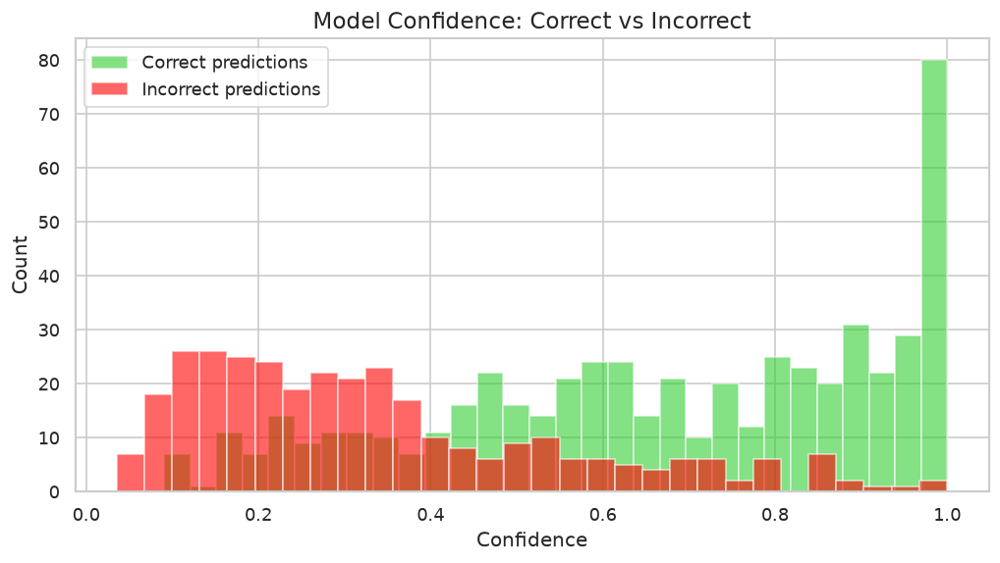

Mean confidence (correct): 0.6753
Mean confidence (incorrect): 0.3357


In [66]:
correct_mask = np.array(all_preds) == np.array(all_labels)
correct_conf = np.array(all_confidences)[correct_mask]
incorrect_conf = np.array(all_confidences)[~correct_mask]

plt.figure(figsize=(10, 5))
plt.hist(correct_conf, bins=30, alpha=0.6, label="Correct predictions", color="limegreen")
plt.hist(incorrect_conf, bins=30, alpha=0.6, label="Incorrect predictions", color="red")
plt.xlabel("Confidence")
plt.ylabel("Count")
plt.title("Model Confidence: Correct vs Incorrect")
plt.legend()
plt.show()

print(f"Mean confidence (correct): {correct_conf.mean():.4f}")
print(f"Mean confidence (incorrect): {incorrect_conf.mean():.4f}")

## Unfreeze Last 2 Blocks
Allows gradients to flow into the final feature blocks of EfficientNet-B3, so the model can
learn coin-specific detail instead of relying only on generic ImageNet features.

In [67]:
for param in model.features[-2:].parameters():
    param.requires_grad = True

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Total parameters: 11,091,241
Trainable parameters: 4,272,123


## Loss Function with Label Smoothing
Softens the target labels to reduce overconfidence, which helps given the small per-class test support.

In [68]:
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

## Optimizer with Differentiated Learning Rates
Uses a lower learning rate for the newly unfrozen backbone layers and a higher one for the
classifier head, plus weight decay to reduce overfitting.

In [69]:
optimizer = torch.optim.Adam([
    {"params": model.features[-2:].parameters(), "lr": 1e-5},
    {"params": model.classifier.parameters(), "lr": 1e-4},
], weight_decay=1e-4)

print("Optimizer ready:")
print("- Unfrozen backbone layers: lr=1e-5")
print("- Classifier head: lr=1e-4")
print("- Weight decay: 1e-4")

Optimizer ready:
- Unfrozen backbone layers: lr=1e-5
- Classifier head: lr=1e-4
- Weight decay: 1e-4


## Learning Rate Scheduler
Reduces the learning rate if validation loss stops improving.

In [70]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3
)
print("Scheduler ready: ReduceLROnPlateau (factor=0.5, patience=3)")

Scheduler ready: ReduceLROnPlateau (factor=0.5, patience=3)


## Setup Fine-tuned Checkpoint Path
Defines a separate checkpoint file so the original Phase 6 model stays intact for comparison.

In [71]:
FINETUNE_CHECKPOINT_PATH = os.path.join(MODELS_DIR, "best_model_finetuned.pth")
print("Fine-tuned checkpoint will be saved to:", FINETUNE_CHECKPOINT_PATH)

Fine-tuned checkpoint will be saved to: C:\Users\arnol\OneDrive\Documentos\Progaming\Datascience\datascience\CoinVision\models\best_model_finetuned.pth


## Fine-tuning Loop
Trains the partially unfrozen model for 15 epochs, tracking loss and accuracy, and saving
the best checkpoint by validation accuracy.

In [72]:
NUM_EPOCHS_FT = 15
best_val_acc_ft = 0.0

history_ft = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

start_time = time.time()

for epoch in tqdm(range(1, NUM_EPOCHS_FT + 1), desc="Fine-tuning"):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, scaler, device)
    val_loss, val_acc = validate_one_epoch(model, val_loader, criterion, device)

    scheduler.step(val_loss)

    history_ft["train_loss"].append(train_loss)
    history_ft["val_loss"].append(val_loss)
    history_ft["train_acc"].append(train_acc)
    history_ft["val_acc"].append(val_acc)

    if val_acc > best_val_acc_ft:
        best_val_acc_ft = val_acc
        torch.save(model.state_dict(), FINETUNE_CHECKPOINT_PATH)
        marker = "  <- best so far, saved"
    else:
        marker = ""

    print(f"Epoch {epoch}/{NUM_EPOCHS_FT} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}{marker}")

total_time_ft = time.time() - start_time
print(f"\nFine-tuning completed in {total_time_ft/60:.1f} minutes")
print(f"Best validation accuracy (fine-tuned): {best_val_acc_ft:.4f}")

Fine-tuning:   7%|▋         | 1/15 [00:48<11:13, 48.13s/it]

Epoch 1/15 | Train Loss: 1.6667 Acc: 0.8649 | Val Loss: 2.1702 Acc: 0.7293  <- best so far, saved


Fine-tuning:  13%|█▎        | 2/15 [01:40<11:00, 50.83s/it]

Epoch 2/15 | Train Loss: 1.5836 Acc: 0.8846 | Val Loss: 2.3430 Acc: 0.7368  <- best so far, saved


Fine-tuning:  20%|██        | 3/15 [02:33<10:17, 51.47s/it]

Epoch 3/15 | Train Loss: 1.5482 Acc: 0.8876 | Val Loss: 2.0937 Acc: 0.7481  <- best so far, saved


Fine-tuning:  27%|██▋       | 4/15 [03:29<09:45, 53.24s/it]

Epoch 4/15 | Train Loss: 1.5408 Acc: 0.8940 | Val Loss: 2.0903 Acc: 0.7481


Fine-tuning:  33%|███▎      | 5/15 [04:23<08:57, 53.70s/it]

Epoch 5/15 | Train Loss: 1.5091 Acc: 0.8987 | Val Loss: 2.1113 Acc: 0.7368


Fine-tuning:  40%|████      | 6/15 [05:22<08:18, 55.38s/it]

Epoch 6/15 | Train Loss: 1.4973 Acc: 0.9035 | Val Loss: 2.0415 Acc: 0.7481


Fine-tuning:  47%|████▋     | 7/15 [06:16<07:19, 54.96s/it]

Epoch 7/15 | Train Loss: 1.4761 Acc: 0.9095 | Val Loss: nan Acc: 0.7431


Fine-tuning:  53%|█████▎    | 8/15 [07:13<06:29, 55.66s/it]

Epoch 8/15 | Train Loss: 1.4628 Acc: 0.9108 | Val Loss: 2.1221 Acc: 0.7444


Fine-tuning:  60%|██████    | 9/15 [08:16<05:47, 57.90s/it]

Epoch 9/15 | Train Loss: 1.4629 Acc: 0.9108 | Val Loss: 2.0023 Acc: 0.7519  <- best so far, saved


Fine-tuning:  67%|██████▋   | 10/15 [09:14<04:50, 58.14s/it]

Epoch 10/15 | Train Loss: 1.4398 Acc: 0.9147 | Val Loss: 2.0011 Acc: 0.7556  <- best so far, saved


Fine-tuning:  73%|███████▎  | 11/15 [10:14<03:54, 58.67s/it]

Epoch 11/15 | Train Loss: 1.4494 Acc: 0.9125 | Val Loss: 1.9811 Acc: 0.7556


Fine-tuning:  80%|████████  | 12/15 [11:12<02:55, 58.43s/it]

Epoch 12/15 | Train Loss: 1.4314 Acc: 0.9189 | Val Loss: 2.0004 Acc: 0.7544


Fine-tuning:  87%|████████▋ | 13/15 [12:13<01:58, 59.11s/it]

Epoch 13/15 | Train Loss: 1.4109 Acc: 0.9236 | Val Loss: 1.9869 Acc: 0.7594  <- best so far, saved


Fine-tuning:  93%|█████████▎| 14/15 [13:30<01:04, 64.66s/it]

Epoch 14/15 | Train Loss: 1.4152 Acc: 0.9211 | Val Loss: 1.9482 Acc: 0.7594


Fine-tuning: 100%|██████████| 15/15 [14:40<00:00, 58.68s/it]

Epoch 15/15 | Train Loss: 1.3958 Acc: 0.9286 | Val Loss: 4.3648 Acc: 0.7531

Fine-tuning completed in 14.7 minutes
Best validation accuracy (fine-tuned): 0.7594


## Plot Fine-tuning Curves
Visualizes loss and accuracy over epochs for the fine-tuning run.

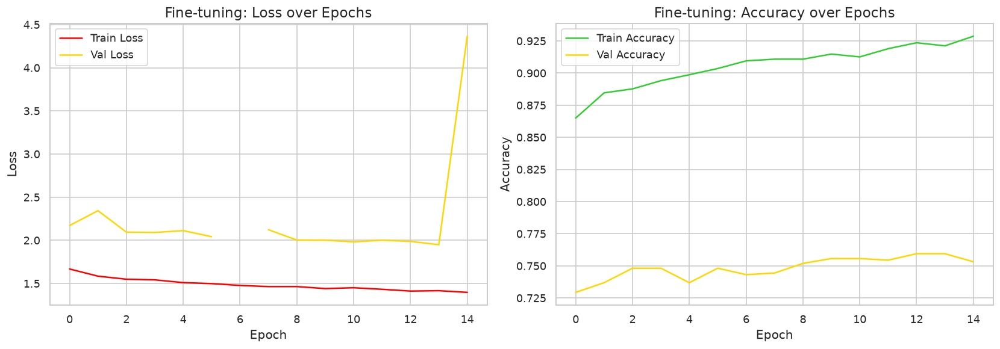

In [73]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_ft["train_loss"], label="Train Loss", color="red")
axes[0].plot(history_ft["val_loss"], label="Val Loss", color="gold")
axes[0].set_title("Fine-tuning: Loss over Epochs")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].legend()

axes[1].plot(history_ft["train_acc"], label="Train Accuracy", color="limegreen")
axes[1].plot(history_ft["val_acc"], label="Val Accuracy", color="gold")
axes[1].set_title("Fine-tuning: Accuracy over Epochs")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Accuracy")
axes[1].legend()

plt.tight_layout()
plt.show()

## Evaluate Fine-tuned Model on Test Set
Loads the best fine-tuned checkpoint and compares its test accuracy against the Phase 7 baseline.

In [74]:
model.load_state_dict(torch.load(FINETUNE_CHECKPOINT_PATH, map_location=device))
model.eval()

test_loss_ft, test_acc_ft = validate_one_epoch(model, test_loader, criterion, device)

print(f"Fine-tuned Test Loss: {test_loss_ft:.4f}")
print(f"Fine-tuned Test Accuracy: {test_acc_ft:.4f}")
print(f"\nComparison vs Phase 7 (frozen base): 0.6161 -> {test_acc_ft:.4f}")

Fine-tuned Test Loss: 3.3147
Fine-tuned Test Accuracy: 0.6498

Comparison vs Phase 7 (frozen base): 0.6161 -> 0.6498


## Recompute Predictions with Fine-tuned Model
Phase 7's predictions came from the frozen-base model. Re-run inference with the
fine-tuned model so correct/incorrect examples reflect the final model.

In [75]:
all_preds_ft, all_labels_ft, all_confidences_ft = [], [], []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)
        confidences, predicted = torch.max(probs, dim=1)

        all_preds_ft.extend(predicted.cpu().numpy())
        all_labels_ft.extend(labels.numpy())
        all_confidences_ft.extend(confidences.cpu().numpy())

print("Predictions collected:", len(all_preds_ft))

Predictions collected: 868


## Grad-CAM Setup
Registers hooks on the last convolutional block to capture activations and gradients,
then combines them into a class-discriminative heatmap.

In [76]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.activations = None
        self.gradients = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx):
        self.model.zero_grad()
        output = self.model(input_tensor)
        score = output[0, class_idx]
        score.backward()

        weights = self.gradients[0].mean(dim=(1, 2))
        cam = torch.zeros(self.activations.shape[2:], device=self.activations.device)
        for i, w in enumerate(weights):
            cam += w * self.activations[0, i]

        cam = torch.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam.cpu().numpy()

grad_cam = GradCAM(model, target_layer=model.features[-1])
print("Grad-CAM ready, hooked on model.features[-1]")

Grad-CAM ready, hooked on model.features[-1]


## Select Correct and Incorrect Examples
Picks a few correctly and incorrectly classified test images for side-by-side comparison.

In [77]:
correct_idx = [i for i, (p, l) in enumerate(zip(all_preds_ft, all_labels_ft)) if p == l]
incorrect_idx = [i for i, (p, l) in enumerate(zip(all_preds_ft, all_labels_ft)) if p != l]

np.random.seed(42)
sample_correct = np.random.choice(correct_idx, size=4, replace=False)
sample_incorrect = np.random.choice(incorrect_idx, size=4, replace=False)

print("Correct examples selected:", sample_correct)
print("Incorrect examples selected:", sample_incorrect)

Correct examples selected: [840 824 350 825]
Incorrect examples selected: [548 694 331  71]


## Generate and Plot Grad-CAM Heatmaps
Overlays the heatmap on each original image, side by side: correct predictions on top,
incorrect predictions on the bottom.

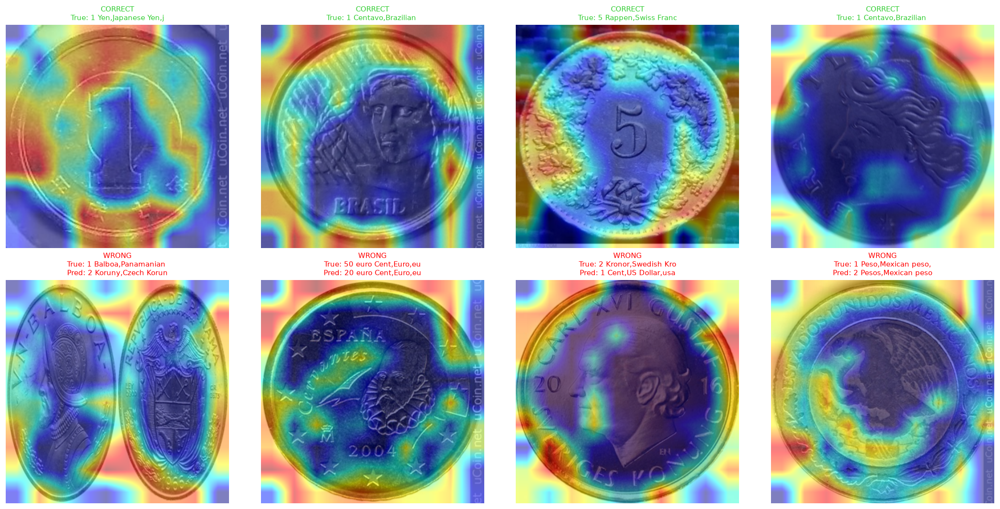

In [78]:
def get_gradcam_overlay(idx, dataset, model, grad_cam, device):
    row = dataset.data.iloc[idx]
    orig_image = Image.open(row["file_path"]).convert("RGB").resize((300, 300))

    input_tensor, label = dataset[idx]
    input_tensor = input_tensor.unsqueeze(0).to(device)

    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

    cam = grad_cam.generate(input_tensor, pred_class)
    cam_resized = cv2.resize(cam, (300, 300))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = np.array(orig_image) * 0.5 + heatmap * 0.5
    overlay = overlay.astype(np.uint8)

    true_name = cat_to_name.get(str(idx_to_class[label]), str(idx_to_class[label]))
    pred_name = cat_to_name.get(str(idx_to_class[pred_class]), str(idx_to_class[pred_class]))
    return overlay, true_name, pred_name

fig, axes = plt.subplots(2, 4, figsize=(18, 9))

for col, idx in enumerate(sample_correct):
    overlay, true_name, pred_name = get_gradcam_overlay(idx, test_dataset, model, grad_cam, device)
    axes[0, col].imshow(overlay)
    axes[0, col].set_title(f"CORRECT\nTrue: {true_name[:20]}", fontsize=9, color="limegreen")
    axes[0, col].axis("off")

for col, idx in enumerate(sample_incorrect):
    overlay, true_name, pred_name = get_gradcam_overlay(idx, test_dataset, model, grad_cam, device)
    axes[1, col].imshow(overlay)
    axes[1, col].set_title(f"WRONG\nTrue: {true_name[:20]}\nPred: {pred_name[:20]}", fontsize=9, color="red")
    axes[1, col].axis("off")

plt.tight_layout()
plt.show()

## Standalone Prediction Function
Classifies a new coin image end-to-end: preprocesses, predicts top-3 classes with confidence, and returns its Grad-CAM overlay for visualization.

In [79]:
def predict_coin(image_path, model, grad_cam, transform, idx_to_class, cat_to_name, device, top_k=3):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    output = model(input_tensor)
    probs = torch.softmax(output, dim=1)[0]
    top_probs, top_idxs = torch.topk(probs, top_k)

    results = []
    for prob, idx in zip(top_probs, top_idxs):
        class_name = cat_to_name.get(str(idx_to_class[idx.item()]), str(idx_to_class[idx.item()]))
        results.append((class_name, prob.item()))

    pred_class = top_idxs[0].item()
    cam = grad_cam.generate(input_tensor, pred_class)
    cam_resized = cv2.resize(cam, image.size)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    orig_resized = np.array(image.resize(image.size))
    overlay = (orig_resized * 0.5 + heatmap * 0.5).astype(np.uint8)

    return results, overlay

print("predict_coin() ready for use with any new coin image path")

predict_coin() ready for use with any new coin image path


## Demo: Run Prediction on a Sample Test Image
Quick sanity check using one image already in the test set.

Top-3 predictions:
  1 Yen,Japanese Yen,japan: 56.40%
  10 Kurus,Turkish Lira,turkey: 7.44%
  10 Hellers,Czech Koruna,czech_republic: 5.50%


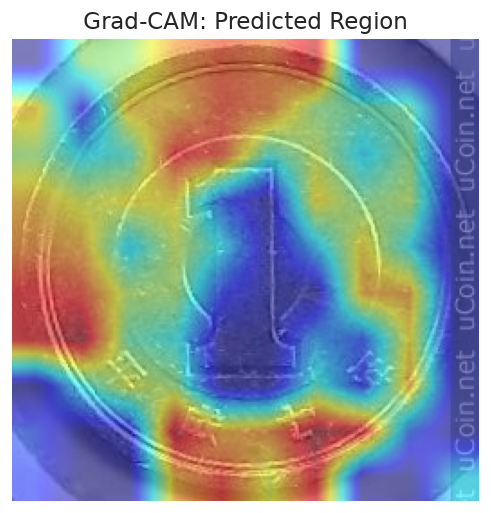

In [80]:
demo_path = test_dataset.data.iloc[sample_correct[0]]["file_path"]

results, overlay = predict_coin(
    demo_path, model, grad_cam, val_test_transform, idx_to_class, cat_to_name, device
)

print("Top-3 predictions:")
for name, prob in results:
    print(f"  {name}: {prob:.2%}")

plt.imshow(overlay)
plt.title("Grad-CAM: Predicted Region")
plt.axis("off")
plt.show()

## Hierarchical Two-Stage Classification
Tests whether predicting currency/country first, then denomination within that group, reduces the within-currency confusion found earlier in evaluation. Shares the EfficientNet-B3 backbone across two heads — one for the 211 fine-grained classes, one for the coarser
currency+country group — and uses masked inference to restrict the class prediction to the predicted group.


## Build Currency+Country Groups
Parses cat_to_name to derive a coarse group label (currency + country) for every class.

In [81]:
def get_group_key(class_id):
    full_name = cat_to_name.get(str(class_id), str(class_id))
    parts = [p.strip() for p in full_name.split(",")]
    if len(parts) >= 3:
        return f"{parts[1]}|{parts[2]}"  # currency|country
    return full_name

group_keys = [get_group_key(idx_to_class[i]) for i in range(num_classes)]
unique_groups = sorted(set(group_keys))
group_to_idx = {g: i for i, g in enumerate(unique_groups)}

class_to_group_idx = torch.tensor(
    [group_to_idx[g] for g in group_keys], dtype=torch.long
).to(device)

print(f"Classes: {num_classes}")
print(f"Currency/country groups: {len(group_to_idx)}")
print(f"Avg denominations per group: {num_classes/len(group_to_idx):.2f}")

Classes: 257
Currency/country groups: 41
Avg denominations per group: 6.27


## Define Hierarchical Model
Shares the EfficientNet-B3 backbone across two heads: one for the 211 fine-grained classes, one for the coarser currency+country group.

In [82]:
class HierarchicalCoinNet(nn.Module):
    def __init__(self, num_classes, num_groups):
        super().__init__()
        base = models.efficientnet_b3(weights=None)
        self.features = base.features
        self.avgpool = base.avgpool
        in_features = base.classifier[1].in_features
        self.dropout = nn.Dropout(p=0.3)
        self.class_head = nn.Linear(in_features, num_classes)
        self.group_head = nn.Linear(in_features, num_groups)

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.dropout(x)
        return self.class_head(x), self.group_head(x)

hier_model = HierarchicalCoinNet(num_classes, len(group_to_idx)).to(device)
print("HierarchicalCoinNet created")

HierarchicalCoinNet created


## Warm-start from Phase 8 Checkpoint
Loads the fine-tuned weights into the shared backbone and class head, so training starts from ~67% test accuracy instead of scratch. The new group head starts fresh.

In [83]:
finetuned_state = torch.load(FINETUNE_CHECKPOINT_PATH, map_location=device)

new_state = {}
for k, v in finetuned_state.items():
    if k.startswith("features."):
        new_state[k] = v
    elif k.startswith("classifier.1."):
        new_state[k.replace("classifier.1.", "class_head.")] = v

missing, unexpected = hier_model.load_state_dict(new_state, strict=False)
print("Missing keys (expected: only group_head.*):", missing)
print("Unexpected keys (expected: none):", unexpected)

Missing keys (expected: only group_head.*): ['group_head.weight', 'group_head.bias']
Unexpected keys (expected: none): []


## Freeze / Unfreeze Layers
Same strategy as Phase 8: last 2 backbone blocks trainable, plus both new heads.

In [84]:
for param in hier_model.parameters():
    param.requires_grad = False
for param in hier_model.features[-2:].parameters():
    param.requires_grad = True
for param in hier_model.class_head.parameters():
    param.requires_grad = True
for param in hier_model.group_head.parameters():
    param.requires_grad = True

trainable = sum(p.numel() for p in hier_model.parameters() if p.requires_grad)
print(f"Trainable parameters: {trainable:,}")

Trainable parameters: 4,335,140


## Loss, Optimizer, and Scheduler
Combined loss = class loss + weighted group loss. Gradient clipping added this time to prevent the instability seen in Phase 8 (loss spikes during fine-tuning).

In [85]:
criterion_class = nn.CrossEntropyLoss(label_smoothing=0.1)
criterion_group = nn.CrossEntropyLoss(label_smoothing=0.1)
GROUP_LOSS_WEIGHT = 0.4

optimizer = torch.optim.Adam([
    {"params": hier_model.features[-2:].parameters(), "lr": 1e-5},
    {"params": hier_model.class_head.parameters(), "lr": 1e-4},
    {"params": hier_model.group_head.parameters(), "lr": 1e-4},
], weight_decay=1e-4)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3)
print("Optimizer ready")

Optimizer ready


## Hierarchical Inference with Masking
Predicts the group first, then restricts the 211-class prediction to only classes within that group before taking the final argmax.

In [86]:
def hierarchical_predict(class_logits, group_logits, class_to_group):
    pred_group = group_logits.argmax(dim=1)
    mask = (class_to_group.unsqueeze(0) == pred_group.unsqueeze(1))
    masked_logits = class_logits.masked_fill(~mask, float("-inf"))
    pred_class = masked_logits.argmax(dim=1)
    return pred_class, pred_group

print("hierarchical_predict() ready")

hierarchical_predict() ready


## Training and Validation Functions
Track both class accuracy and group accuracy per epoch. Evaluation runs in fp32 , same fix applied in Phase 8.

In [87]:
def train_one_epoch_hier(model, loader, class_to_group, optimizer, device, weight=0.4):
    model.train()
    running_loss, correct_class, correct_group, total = 0.0, 0, 0, 0
    for images, labels in loader:
        images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        group_labels = class_to_group[labels]

        optimizer.zero_grad()
        class_logits, group_logits = model(images)
        loss = criterion_class(class_logits, labels) + weight * criterion_group(group_logits, group_labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        correct_class += (class_logits.argmax(1) == labels).sum().item()
        correct_group += (group_logits.argmax(1) == group_labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct_class / total, correct_group / total


def validate_one_epoch_hier(model, loader, class_to_group, device, weight=0.4):
    model.eval()
    running_loss, correct_class, correct_group, correct_hier, total = 0.0, 0, 0, 0, 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            group_labels = class_to_group[labels]

            class_logits, group_logits = model(images)
            loss = criterion_class(class_logits, labels) + weight * criterion_group(group_logits, group_labels)

            pred_hier, _ = hierarchical_predict(class_logits, group_logits, class_to_group)

            running_loss += loss.item() * images.size(0)
            correct_class += (class_logits.argmax(1) == labels).sum().item()
            correct_group += (group_logits.argmax(1) == group_labels).sum().item()
            correct_hier += (pred_hier == labels).sum().item()
            total += labels.size(0)

    return running_loss / total, correct_class / total, correct_group / total, correct_hier / total

## Training Loop
Trains for 10 epochs, saving the checkpoint with the best validation class accuracy.

In [88]:
HIER_CHECKPOINT_PATH = os.path.join(MODELS_DIR, "best_model_hierarchical.pth")
NUM_EPOCHS_HIER = 20
best_val_hier_acc = 0.0

history_hier = {"train_loss": [], "val_loss": [], "train_class_acc": [], "val_class_acc": [],
                 "train_group_acc": [], "val_group_acc": [], "val_hier_acc": []}

start_time = time.time()

for epoch in tqdm(range(1, NUM_EPOCHS_HIER + 1), desc="Hierarchical training"):
    train_loss, train_class_acc, train_group_acc = train_one_epoch_hier(
        hier_model, train_loader, class_to_group_idx, optimizer, device, GROUP_LOSS_WEIGHT
    )
    val_loss, val_class_acc, val_group_acc, val_hier_acc = validate_one_epoch_hier(
        hier_model, val_loader, class_to_group_idx, device, GROUP_LOSS_WEIGHT
    )

    scheduler.step(val_loss)

    history_hier["train_loss"].append(train_loss)
    history_hier["val_loss"].append(val_loss)
    history_hier["train_class_acc"].append(train_class_acc)
    history_hier["val_class_acc"].append(val_class_acc)
    history_hier["train_group_acc"].append(train_group_acc)
    history_hier["val_group_acc"].append(val_group_acc)
    history_hier["val_hier_acc"].append(val_hier_acc)

    if val_hier_acc > best_val_hier_acc:
        best_val_hier_acc = val_hier_acc
        torch.save(hier_model.state_dict(), HIER_CHECKPOINT_PATH)
        marker = "  <- best so far, saved"
    else:
        marker = ""

    print(f"Epoch {epoch}/{NUM_EPOCHS_HIER} | "
          f"Train Loss: {train_loss:.4f} ClassAcc: {train_class_acc:.4f} GroupAcc: {train_group_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} ClassAcc: {val_class_acc:.4f} GroupAcc: {val_group_acc:.4f} HierAcc: {val_hier_acc:.4f}{marker}")

print(f"\nTraining completed in {(time.time() - start_time)/60:.1f} minutes")
print(f"Best validation hierarchical accuracy: {best_val_hier_acc:.4f}")

Hierarchical training:   5%|▌         | 1/20 [01:35<30:14, 95.48s/it]

Epoch 1/20 | Train Loss: 2.7896 ClassAcc: 0.9332 GroupAcc: 0.1258 | Val Loss: 10.5200 ClassAcc: 0.7481 GroupAcc: 0.2444 HierAcc: 0.2143  <- best so far, saved


Hierarchical training:  10%|█         | 2/20 [03:02<27:12, 90.68s/it]

Epoch 2/20 | Train Loss: 2.6759 ClassAcc: 0.9390 GroupAcc: 0.2498 | Val Loss: 3.2557 ClassAcc: 0.7506 GroupAcc: 0.3471 HierAcc: 0.2945  <- best so far, saved


Hierarchical training:  15%|█▌        | 3/20 [04:23<24:22, 86.04s/it]

Epoch 3/20 | Train Loss: 2.6053 ClassAcc: 0.9337 GroupAcc: 0.3195 | Val Loss: 3.1710 ClassAcc: 0.7682 GroupAcc: 0.4148 HierAcc: 0.3622  <- best so far, saved


Hierarchical training:  20%|██        | 4/20 [05:45<22:32, 84.52s/it]

Epoch 4/20 | Train Loss: 2.5215 ClassAcc: 0.9399 GroupAcc: 0.3904 | Val Loss: 3.1600 ClassAcc: 0.7519 GroupAcc: 0.4624 HierAcc: 0.3972  <- best so far, saved


Hierarchical training:  25%|██▌       | 5/20 [07:11<21:17, 85.16s/it]

Epoch 5/20 | Train Loss: 2.4711 ClassAcc: 0.9368 GroupAcc: 0.4446 | Val Loss: 3.2983 ClassAcc: 0.7581 GroupAcc: 0.5050 HierAcc: 0.4373  <- best so far, saved


Hierarchical training:  30%|███       | 6/20 [08:32<19:29, 83.51s/it]

Epoch 6/20 | Train Loss: 2.3989 ClassAcc: 0.9410 GroupAcc: 0.4882 | Val Loss: 3.0973 ClassAcc: 0.7569 GroupAcc: 0.5576 HierAcc: 0.4825  <- best so far, saved


Hierarchical training:  35%|███▌      | 7/20 [09:52<17:53, 82.54s/it]

Epoch 7/20 | Train Loss: 2.3341 ClassAcc: 0.9467 GroupAcc: 0.5402 | Val Loss: 2.9399 ClassAcc: 0.7632 GroupAcc: 0.5877 HierAcc: 0.5100  <- best so far, saved


Hierarchical training:  40%|████      | 8/20 [11:15<16:29, 82.49s/it]

Epoch 8/20 | Train Loss: 2.2807 ClassAcc: 0.9456 GroupAcc: 0.5759 | Val Loss: 2.8900 ClassAcc: 0.7569 GroupAcc: 0.6128 HierAcc: 0.5301  <- best so far, saved


Hierarchical training:  45%|████▌     | 9/20 [12:35<15:00, 81.87s/it]

Epoch 9/20 | Train Loss: 2.2372 ClassAcc: 0.9451 GroupAcc: 0.6015 | Val Loss: 2.8403 ClassAcc: 0.7732 GroupAcc: 0.6291 HierAcc: 0.5551  <- best so far, saved


Hierarchical training:  50%|█████     | 10/20 [13:55<13:33, 81.36s/it]

Epoch 10/20 | Train Loss: 2.1950 ClassAcc: 0.9443 GroupAcc: 0.6279 | Val Loss: 2.8013 ClassAcc: 0.7619 GroupAcc: 0.6341 HierAcc: 0.5539


Hierarchical training:  55%|█████▌    | 11/20 [15:15<12:08, 80.90s/it]

Epoch 11/20 | Train Loss: 2.1569 ClassAcc: 0.9473 GroupAcc: 0.6422 | Val Loss: 2.7864 ClassAcc: 0.7657 GroupAcc: 0.6441 HierAcc: 0.5664  <- best so far, saved


Hierarchical training:  60%|██████    | 12/20 [16:37<10:49, 81.23s/it]

Epoch 12/20 | Train Loss: 2.1125 ClassAcc: 0.9491 GroupAcc: 0.6682 | Val Loss: 2.7171 ClassAcc: 0.7732 GroupAcc: 0.6604 HierAcc: 0.5865  <- best so far, saved


Hierarchical training:  65%|██████▌   | 13/20 [17:59<09:29, 81.38s/it]

Epoch 13/20 | Train Loss: 2.0835 ClassAcc: 0.9518 GroupAcc: 0.6819 | Val Loss: 2.6942 ClassAcc: 0.7732 GroupAcc: 0.6817 HierAcc: 0.6003  <- best so far, saved


Hierarchical training:  70%|███████   | 14/20 [19:19<08:06, 81.11s/it]

Epoch 14/20 | Train Loss: 2.0627 ClassAcc: 0.9518 GroupAcc: 0.6968 | Val Loss: 2.6593 ClassAcc: 0.7669 GroupAcc: 0.6992 HierAcc: 0.6140  <- best so far, saved


Hierarchical training:  75%|███████▌  | 15/20 [20:38<06:41, 80.29s/it]

Epoch 15/20 | Train Loss: 2.0208 ClassAcc: 0.9553 GroupAcc: 0.7151 | Val Loss: 2.6190 ClassAcc: 0.7744 GroupAcc: 0.7018 HierAcc: 0.6190  <- best so far, saved


Hierarchical training:  80%|████████  | 16/20 [22:00<05:23, 80.93s/it]

Epoch 16/20 | Train Loss: 2.0012 ClassAcc: 0.9531 GroupAcc: 0.7257 | Val Loss: 2.6088 ClassAcc: 0.7744 GroupAcc: 0.7206 HierAcc: 0.6391  <- best so far, saved


Hierarchical training:  85%|████████▌ | 17/20 [23:23<04:04, 81.60s/it]

Epoch 17/20 | Train Loss: 1.9836 ClassAcc: 0.9537 GroupAcc: 0.7396 | Val Loss: 2.5902 ClassAcc: 0.7807 GroupAcc: 0.7431 HierAcc: 0.6566  <- best so far, saved


Hierarchical training:  90%|█████████ | 18/20 [24:46<02:44, 82.07s/it]

Epoch 18/20 | Train Loss: 1.9519 ClassAcc: 0.9557 GroupAcc: 0.7497 | Val Loss: 2.6238 ClassAcc: 0.7732 GroupAcc: 0.7206 HierAcc: 0.6353


Hierarchical training:  95%|█████████▌| 19/20 [26:08<01:21, 81.82s/it]

Epoch 19/20 | Train Loss: 1.9256 ClassAcc: 0.9586 GroupAcc: 0.7649 | Val Loss: 2.6551 ClassAcc: 0.7719 GroupAcc: 0.7381 HierAcc: 0.6529


Hierarchical training: 100%|██████████| 20/20 [27:29<00:00, 82.48s/it]

Epoch 20/20 | Train Loss: 1.9092 ClassAcc: 0.9586 GroupAcc: 0.7693 | Val Loss: 2.8431 ClassAcc: 0.7732 GroupAcc: 0.7607 HierAcc: 0.6704  <- best so far, saved

Training completed in 27.5 minutes
Best validation hierarchical accuracy: 0.6704


## Evaluate on Test Set: Flat vs Hierarchical
Compares plain argmax (flat, ignores group) against masked hierarchical prediction, using the best hierarchical checkpoint.

In [89]:
hier_model.load_state_dict(torch.load(HIER_CHECKPOINT_PATH, map_location=device))
hier_model.eval()

correct_flat, correct_hier, total = 0, 0, 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        class_logits, group_logits = hier_model(images)

        pred_flat = class_logits.argmax(dim=1)
        pred_hier, _ = hierarchical_predict(class_logits, group_logits, class_to_group_idx)

        correct_flat += (pred_flat == labels).sum().item()
        correct_hier += (pred_hier == labels).sum().item()
        total += labels.size(0)

flat_acc = correct_flat / total
hier_acc = correct_hier / total

print(f"Flat prediction accuracy:         {flat_acc:.4f}")
print(f"Hierarchical (masked) accuracy:   {hier_acc:.4f}")
print(f"\nComparison vs Phase 8 baseline (0.6694): flat {flat_acc:.4f} -> hierarchical {hier_acc:.4f}")

Flat prediction accuracy:         0.6786
Hierarchical (masked) accuracy:   0.5461

Comparison vs Phase 8 baseline (0.6694): flat 0.6786 -> hierarchical 0.5461
